# 🐶 End-to-end Multi-class Dog Breed Classification:

This notebook builds and end to end multi-class image classifier using TensorFlow 2.0 and TensorFlow Hub.

#1.Problem
Identifying the breed of a dog given an image of a dog.
When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is .

#2.Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/competitions/dog-breed-identification

#3.Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

#4.Features
Some information about the data:
* We're dealing with images (unstrictured data) so it's probably best we use deep learning /transfer learning .
*There ar 120 breeds of dogs (this means there are 120 different classes).
*There are around 10,000+ images in the test set (these images have labels)
*There are around 10,000+ images in the test set (these images have no labels,because we'll want to predict them)



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

### Get our workspace ready:
*Import TensorFlow 2.x

*Import TensorFlow Hub

*Make sure we're using a GPU

In [1]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:",tf.__version__)
print("TF Hub version:", hub.__version__)

#Check for GPU availability
print("GPU","available(YESSSS!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.15.0
TF Hub version: 0.16.1
GPU available(YESSSS!!!!)


## Getting our data ready (turning into Tensors)

With all machine learning  models,our data has to be in numerical format.So that's what we'll be doing first.Turning our images int Tensors(numerical representations).

Let's start by accessing our data and checking out the labels.


In [3]:
#Checking the labels of our data
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: xlabel='breed'>

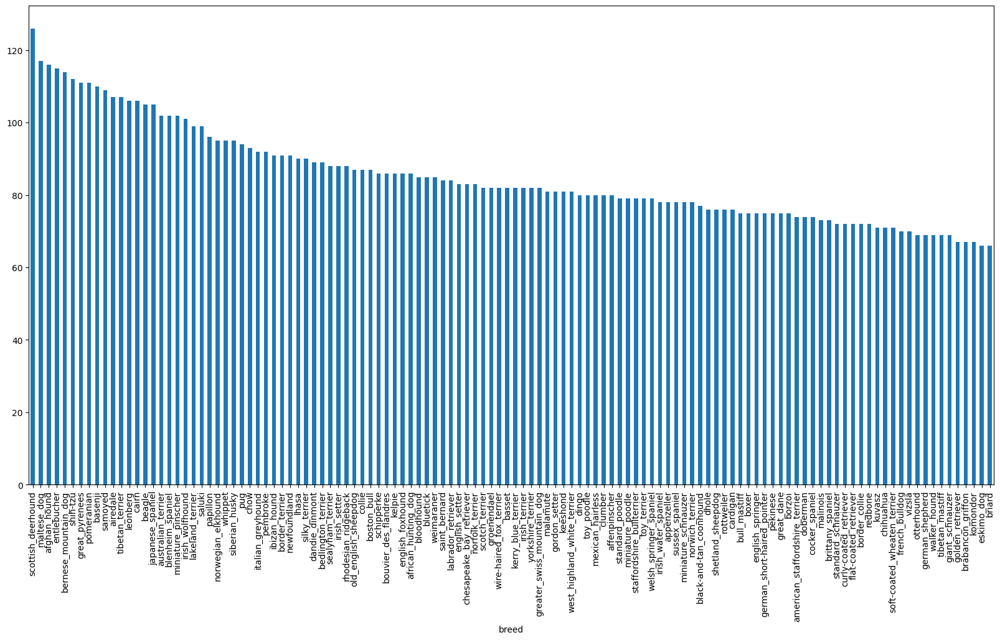

In [5]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv["breed"].value_counts().median()

82.0

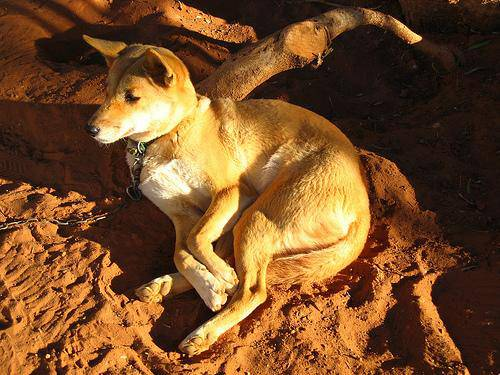

In [7]:
#Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting Images and their labels
Let's get a list of our image file pathnames.

In [8]:
#Create pathnames from image ID's
filenames=["drive/MyDrive/Dog Vision/train/"+ fname + ".jpg" for fname in labels_csv["id"]]

#Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
#Check whether number of filenames matches number of actual  image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/"))== len(filenames):
  print("Filenames match actual amount of files!!! Proceed...")
else:
  print("Filenames do not match actual amount of files,check the target directory.")

Filenames match actual amount of files!!! Proceed...


In [187]:
len(os.listdir("drive/MyDrive/Dog Vision/test/"))

10417

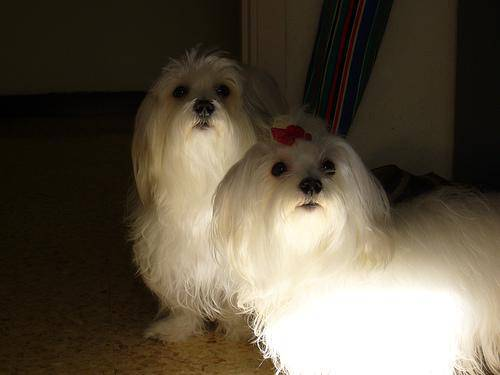

In [10]:
#One more check
Image(filenames[10200])



In [11]:
labels_csv['breed'][10200]

'maltese_dog'

In [12]:
labels_csv['id'][10220]

'ffe5f6d8e2bff356e9482a80a6e29aac'

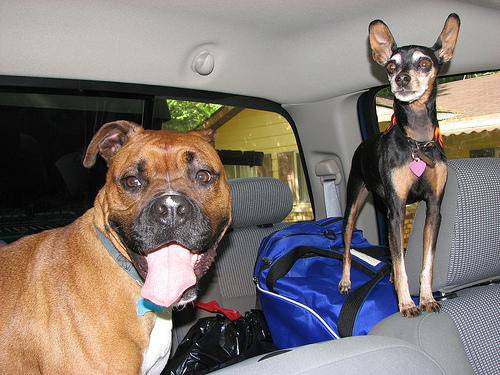

In [13]:
Image("drive/MyDrive/Dog Vision/train/ffe5f6d8e2bff356e9482a80a6e29aac.jpg" )

In [14]:

print(filenames[200])

drive/MyDrive/Dog Vision/train/04a3f5dc6d985601f354ab4434645d83.jpg


Since we've now got our training image filepaths in a list,let's prepare our labels.

In [15]:
labels=labels_csv["breed"]
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [16]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
#labels=np.array(labels)#does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [17]:
len(labels)

10222

In [18]:
#See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else :
  print("Number of labels does not match number of filenames ,check data directories!!")

Number of labels matches number of filenames!


In [19]:
# Find the unique label values
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [20]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [21]:
#Turn every label into boolean array
boolean_labels=[label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
len(boolean_labels)

10222

In [23]:
#Example:Turing boolean array into integers
print(labels[0])#original label
print(np.where(unique_breeds == labels[0]))#index where label occurs
print(boolean_labels[0].argmax())#index where label occurs in boolean array
print(boolean_labels[0].astype(int))#there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [24]:
print(labels[2])
print(boolean_labels[2].astype(int))
print(boolean_labels[2].argmax())

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]
85


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set,we're going to create it own.



In [25]:
#Setup X & y variables
X=filenames
y=boolean_labels


In [26]:
len(filenames)

10222

We're going to start off experimenting with ~1000 images and increase as needed.

In [27]:
NUM_IMAGES = 1000 #@param{type:'slider',min:1000,max:10000,step:1000}

In [28]:
#Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

#Split them into training and validation of total size NUM_IMAGES
X_train,X_val,y_train,y_val= train_test_split(X[:NUM_IMAGES],
                                              y[:NUM_IMAGES],
                                              test_size=0.2,
                                              random_state=42)
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [29]:
#Let's have a geez at the training data
X_train[:5],y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images(turning imagess into Tensors)

To preprocess our images into Tensors we're goionng to write a function which does a few things:

1.Take an image filepath as input

2.Use TensorFlow to read the file and save it to a variable, `image`

3.Turn our `image` (a jpg ) into Tensors

4.Resize the image to be a shape of (224,224)

5.Return the modified image

In [30]:
#Convert image to Numpy Array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [31]:
image.max(),image.min()

(255, 0)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
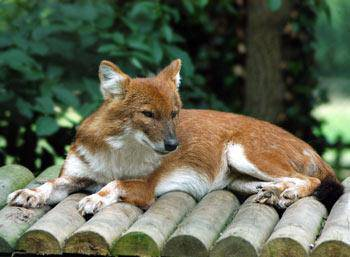

In [32]:
image

In [33]:
#Turn image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

###Now we've seen what and image looks like as a Tensors,let's make a function to preprocess them.
1.Take an image filepath as input

2.Use TensorFlow to read the file and save it to a variable, `image`

3.Turn our `image` (a jpg ) into Tensors

4.Normalize our image(convet color channel values from 0-255 to 0-1).

5.Resize the image to be a shape of (224,224)

6.Return the modified image

In [34]:
#Define image size
IMG_SIZE=224

#Create afunction for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor.

  """
  #Read in an image file or load the image
  image= tf.io.read_file(image_path)
  #Turn the jpeg image into numerical Tensor with 3 colour channels(Red,Green,Blue)
  image=tf.image.decode_jpeg(image,channels=3)
  #Convert the colour channel values from 0-255 to 0-1 values or convert the dtype into float
  image=tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to our desired value(224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
  return image


In [35]:
tensor=tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [36]:
tensor=tf.image.decode_jpeg(tensor,channels=3)
tensor

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [37]:
tf.image.convert_image_dtype(tensor, tf.float32)

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

In [38]:
print(tensor.dtype)

<dtype: 'uint8'>


## Turning out data into batches

Why turn our data into batches?

Let's say you're trying to process to 100000 + images into one go... they all might not fit into memory.

So that's why we do about 32 (this is batch size ) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively,we need our data in the form of Tensor turples which look like this(`image`,label).


In [39]:
#Create a simple function to return a tuple (image,label)
def get_image_label(image_path,label):
  image = process_image(image_path)
  return image,label

In [40]:







#Demo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our  data inot tuples of Tensors in the form: `(image,label)`,let's make a function to turn all our data (x & y)
into batches!

In [109]:
#Define  the batch size , 32 is a good start
BATCH_SIZE = 32

#Create a function to turn data into batches
def create_data_batches(X,y=None,batch_size=BATCH_SIZE, valid_data=False,test_data=False):
  """
   Create batches of data out of image(X) and label(y) pairs.
   Shuffles the data if it's training data but doesn't shuffle if it's validation data.
   Also accepts test data as input (no labels).
   """
  #If the data is a test dataset,we probalbly don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))#only filepaths (no labels)
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #If the data is a valid dataset ,we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                             tf.constant(y)))#labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches...")
    #Turn filepaths and labels into Tensors
    data =  tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                 tf.constant(y)))
    #Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(X))
    #Create (image,label)tuples(this also turns the image path into a preprocesed image)
    data=data.map(get_image_label)
    #Turn the training data into batches
    data_batch=data.batch(BATCH_SIZE)

  return data_batch


In [111]:
#Create training and validation data batches
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches...
Creating validation data batches...


In [112]:
#Check out the different attributes of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

Our data is now  in batches,however these can be a little hard to understand/comprehend ,let's visualized them

In [113]:
import matplotlib.pyplot as plt

#Create a function for viewwing imagews in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  #Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    #Create subplots(5 rows,5 columns)
    ax=plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn the grid lines off
    plt.axis("off")

In [114]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [115]:
train_images,train_labels=next(train_data.as_numpy_iterator())
len(train_images),len(train_labels)

(32, 32)

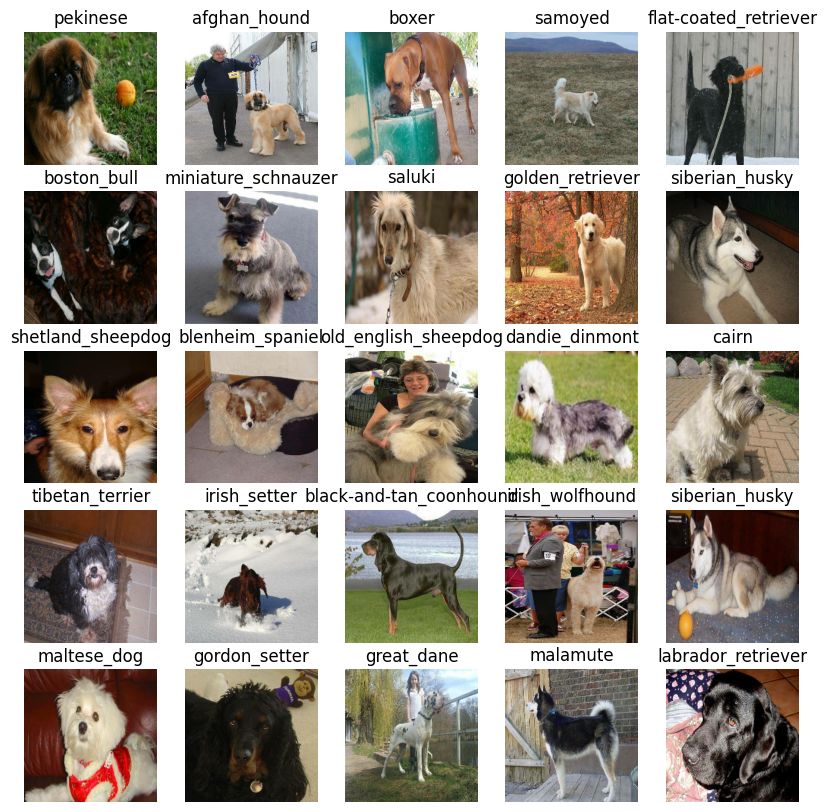

In [116]:
#Now let's visualize the data in a training batch
train_images,train_labels=next(train_data.as_numpy_iterator())
show_25_images(train_images,train_labels)

In [117]:
unique_breeds[y[0].argmax()]

'boston_bull'

In [118]:
unique_breeds[0]

'affenpinscher'

## Building a model

Before we build a model,there  are few things we need to define:
* The input shape (our images shape,in the form of Tensors)to our model.
* The Output shape (image labels,in the form of Tensors)of our model.
* The URL of the model we want to use from Tensorflow Hub-
"https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

In [119]:
#Setup input shape to the model
INPUT_SHAPE= [None,IMG_SIZE,IMG_SIZE,3] # batch,height ,width,colour channels

#Setup Output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

#Setup model Url from TensorFlow Hub
MODEL_URL="https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

Now we've got our inputs,outputs and model ready to go.let's put them together into a keras deep learning model!
Knowing this ,let's create a function which:
* Takes the input shape,and the model we've chosen as parameter.
*Defines the layers in a keras model in sequential fashion (do this first,then this ,then that).
*Builds the model (tells the model the input shape it 'll be getting).
*Returns the model

All the steps can be found here:
https:https://www.tensorflow.org/guide/keras



In [120]:
#Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("Building model with:",MODEL_URL)

  #Setup the model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL),#Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax")# Layer 2 (output layer)
  ])

  #Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  #Build the model
  model.build(INPUT_SHAPE)
  return model



In [121]:
model=create_model()
model.summary()

Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_4 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [122]:
outputs=np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such thing as save its progress ,check its progress or stop training early if a model stops improving.

We'll create two callbacks ,one for TensorBoard  which helps tracks our models progress and another for early stopping which prevents our model from training for to long.

###TensorBoard Callback

To setup a tensorBoard callback,we need to do 3 things:

1.Load the Tensorboard notebook extension

2.Create a TensorBoard callback which is able to save logs to directory and pass it to our model's `fit()` function.

3.Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).

In [123]:
#Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [124]:
import datetime

#Create a function to build a tensorBoard callback
def create_tensorboard_callback():
  #Create a log directory for storing TensorBoard logs
  logdir=os.path.join("drive/MyDrive/Dog Vision/logs",
                      #Make it so the logs get tracked whenever we run an experiment
                      datetime.datetime.now().strftime("%y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping callback
Early stopping helps stop our model from overfitting by stopping training if  a certain evaluation metric stops.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [125]:
#Create early stopping callbacks
early_stopping = tf.keras.callbacks.EarlyStopping (monitor="val_accuracy",
                                                   patience=3)

## Training a model(on subset of data)
Our first  model is only going to train on 1000 images ,to make sure everything is working.


In [126]:
NUM_EPOCHS=100 #@param{type:"slider",min:10,max:100,step:10}


In [127]:
# Check to make sure we 're still running on a GPU
print("GPU","available(YES!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available(YES!!!!)


Let's create a function which trains a model:

*Create a model using  `create_model()`

*Setup a TensorBoard callback using  `create_tensorboard_callback()`.

*Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and callbacks we 'd like to use.

*Return the model.


In [128]:
#Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  #Create a model
  model=create_model()

  #Create new TensorBoard session everytime we train a model
  tensorboard=create_tensorboard_callback()

  #Fit the model to the data it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  #Return the fitted model
  return model

In [129]:
#Fit the model to the data
model=train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Epoch 1/100
25/25 [==============================] - 9s 208ms/step - loss: 4.6438 - accuracy: 0.0850 - val_loss: 3.3619 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 173ms/step - loss: 1.6733 - accuracy: 0.6850 - val_loss: 2.1298 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 5s 184ms/step - loss: 0.5747 - accuracy: 0.9413 - val_loss: 1.6342 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 5s 181ms/step - loss: 0.2545 - accuracy: 0.9900 - val_loss: 1.4342 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 4s 165ms/step - loss: 0.1491 - accuracy: 0.9987 - val_loss: 1.3608 - val_accuracy: 0.6800
Epoch 6/100
25/25 [==============================] - 5s 204ms/step - loss: 0.1020 - accuracy: 0.9987 - val_loss: 1.3102 - val_accuracy: 0.7000
Epoch 7

### Checking the TensorBoard logs
The TensorBoard magic fuction (`%tensorboard`) wil access the logs directory we creaed earlier and visualize its contesntss.


In [130]:
%tensorboard --logdir  drive/MyDrive/Dog\ Vision/logs


Reusing TensorBoard on port 6006 (pid 6723), started 0:35:04 ago. (Use '!kill 6723' to kill it.)

<IPython.core.display.Javascript object>

## Making and evaluating prdictions using  a trained model


In [131]:
#Make prediction on the validation  data (not used to train on)
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 2s 163ms/step


array([[1.8695544e-03, 3.6471634e-04, 4.4383542e-04, ..., 4.5389315e-04,
        4.6495476e-05, 1.4460258e-02],
       [1.5270482e-03, 1.0550654e-03, 6.5943734e-03, ..., 6.8041781e-04,
        2.6034073e-03, 3.4620304e-04],
       [2.2157078e-04, 5.6318255e-05, 2.1205674e-06, ..., 1.9500152e-05,
        3.9027318e-06, 3.3731820e-05],
       ...,
       [1.1589720e-05, 4.2225096e-05, 1.4999614e-05, ..., 1.1746505e-05,
        2.8331118e-04, 2.9595513e-04],
       [2.2972852e-03, 1.3412532e-04, 1.2010860e-04, ..., 7.3906558e-05,
        5.0568884e-05, 1.2573492e-02],
       [2.1788302e-04, 5.2721785e-05, 3.5271732e-04, ..., 1.1502025e-03,
        2.8788594e-03, 2.9283247e-04]], dtype=float32)

In [132]:
predictions[0]

array([1.86955440e-03, 3.64716339e-04, 4.43835423e-04, 2.44934403e-04,
       4.63733915e-04, 1.17065763e-04, 4.77810539e-02, 3.01275635e-03,
       8.29378696e-05, 3.00548709e-04, 2.11718798e-04, 1.12971626e-04,
       8.31429847e-04, 1.27633648e-05, 1.64179510e-04, 4.11175098e-03,
       5.45843832e-05, 2.31902897e-01, 6.75424817e-05, 7.16778013e-05,
       2.99840729e-04, 2.72903184e-04, 6.28633425e-05, 1.10808166e-03,
       8.69533396e-05, 7.60840136e-04, 6.80203438e-02, 1.77717939e-05,
       1.74809259e-03, 7.16342358e-04, 7.09738524e-05, 4.03683807e-04,
       4.14341106e-04, 8.97095961e-05, 4.88039514e-05, 1.69391692e-01,
       2.18139903e-05, 4.97600180e-04, 4.72238258e-04, 4.84618067e-05,
       1.91108708e-03, 1.82046153e-06, 8.84059918e-05, 1.70241110e-04,
       1.40550488e-04, 2.54083279e-04, 4.73046639e-05, 7.60425930e-04,
       1.13866897e-03, 1.48677733e-04, 8.99734878e-05, 1.95811721e-04,
       9.36961151e-04, 1.79025901e-05, 1.15254465e-04, 6.77641656e-05,
      

In [133]:
np.sum(predictions[0])

0.99999994

In [134]:
len(predictions[0])

120

In [135]:
predictions.shape

(200, 120)

In [136]:
len(y_val)

200

In [137]:
#First Prediction
index=42
print(predictions[index])
print(f"Max value (probability of prediction):{np.max(predictions[index])}")
print(f"Sum:{np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Prediction label : {unique_breeds[np.argmax(predictions[index])]}")


[5.5526125e-05 1.3904671e-04 8.3195751e-05 2.4304203e-05 4.4468669e-03
 1.3074979e-04 6.5471511e-05 1.1619423e-03 2.4916455e-02 3.3931371e-02
 1.0056937e-04 2.2444190e-05 3.1139402e-04 2.9991088e-03 3.3894244e-03
 2.2324645e-03 2.3063330e-05 2.0521277e-04 2.5723694e-04 3.8675491e-03
 1.2155887e-05 2.5782676e-03 1.7309001e-04 4.3753822e-05 9.9663157e-03
 1.5668293e-04 3.1160825e-04 6.8155809e-05 1.2710246e-03 6.7085680e-04
 1.5345897e-04 1.4360576e-04 9.9989353e-05 7.6682780e-05 7.1135510e-05
 2.7690887e-05 1.4429698e-04 6.1116146e-04 9.3951639e-05 1.5521033e-01
 1.2757260e-04 4.8321086e-05 2.3664536e-02 5.0816299e-05 1.1319683e-03
 1.2739326e-04 1.0015317e-03 3.8781049e-04 6.7716406e-05 5.5256009e-04
 6.8253437e-05 5.9233145e-05 6.9107930e-04 3.3889331e-03 7.0297378e-05
 5.5101403e-04 3.9537885e-04 2.1885449e-04 2.2455869e-04 5.2565163e-05
 2.1231006e-04 2.6439014e-04 6.0381662e-05 6.3293621e-05 4.3869542e-04
 5.8127709e-05 7.4528193e-04 4.2283803e-04 1.4602104e-03 7.5862359e-04
 5.020

In [138]:
unique_breeds[113]

'walker_hound'

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.


In [139]:
#Turn predictions probabilities into their respective label(easier to understand )
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label=get_pred_label(predictions[81])
pred_label


'dingo'

Now since our validation data is stil in a batch dataset,we'll have to unbatchify to make predictions on the validation images and then compare those predictions to the validation labels(truth labels).

In [140]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [141]:
#Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batches dataset of (image,label) Tensors and returns separate arrays
   of images and labels.
   """
  images=[]
  labels=[]
  #Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

val_images,val_labels= unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [142]:
get_pred_label(val_labels[10])

'affenpinscher'

In [143]:
#get_pred_label(predictions[10])

In [144]:
#This will show wrong prediction because batched data in not unbatched.
images_=[]
labels_=[]
#Loop through unbatched data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0],labels_[0]
print(get_pred_label(labels_[10]))
print(get_pred_label(predictions[10]))

yorkshire_terrier
irish_wolfhound


Now we've got ways to get :
 * Prediction labels
 * Validation labels(truth lablels)
 * Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images as an integers.
* Convert the prediction probabilities to a predictied label.
* Plot the predicted label,its predicted probability ,the truth label and the target images on a single plot.


In [145]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the prediction ,ground truth and image for sample n
  """
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]
  # Get the pred label
  pred_label=get_pred_label(pred_prob)
  #Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the colour of the title depending on if the prediction is right or wrong
  if pred_label== true_label:
    color = "blue"
  else:
    color = "red"

  #Change plot title to be predicted,probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)
  pass

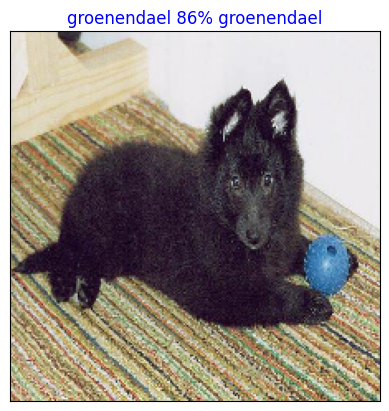

In [146]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our  models top 10 predictions.

This function will:
 *Take a input of prediction probabilities array andd a ground truth array and an integer
 * Find the prediction using `get_pred_label()`
 * Find the top 10:

    * Prediction probabilities indexes
    * Prediction probabilities values
    * Prediction labels.

 *Plot the top 10 prediction probabilities values and labels,coloring the true label blue.


In [147]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction confidence along with the truth lagel for sample n.
  """
  pred_prob,true_label=prediction_probabilities[n],labels[n]

  # Get the predicted label
  pred_label=get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexes
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
  #Find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_indexes]
  #Find the top 10 prediction labels
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot= plt.bar(np.arange(len(top_10_pred_labels)),
                    top_10_pred_values,
                    color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  #Change color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("red")
  else:
      pass


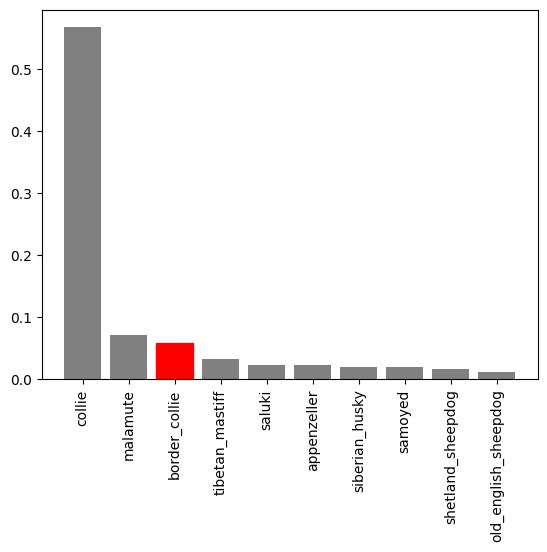

In [148]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

In [149]:
predictions[0].argsort()[-10:][::-1]

array([ 17,  35, 102,  26, 103,   6,  65,  59, 109,  70])

Now we've got some function to help us viaualize our prediction and rvaluate our model,let's check out a few

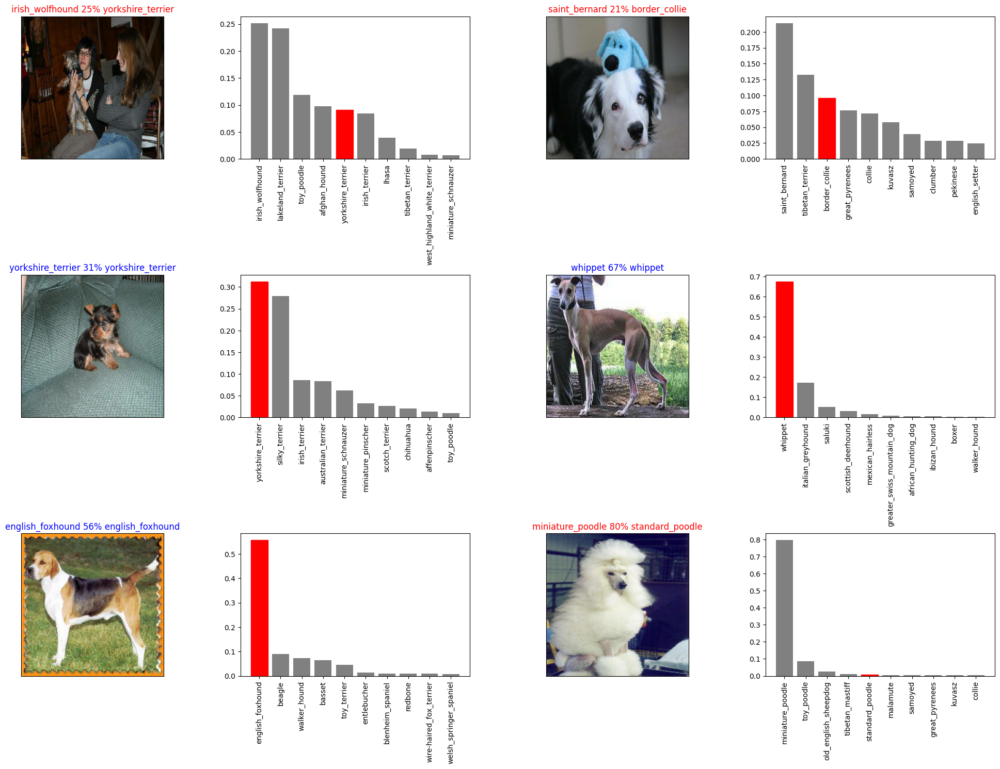

In [150]:
#Let's check out few predictions and their diffrent values
i_multiplier=10
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
            labels=val_labels,
            n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


**Challange:** How would you create matrix with our  models predictions and true labels?


## Saving and reloading a trained model

In [151]:
#Create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir=os.path.join("drive/MyDrive/Dog Vision/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path= modeldir + "-" + ".h5" # save format of model
  print(f"Saving model to : {model_path}....")
  model.save(model_path)
  return model_path


In [152]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from:{model_path}")
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model,let's make sure they work!


In [153]:
#Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog Vision/models/20240425-11091714043358-.h5....


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240425-11091714043358-.h5'

In [154]:
#Load trained model
load_trained_model=load_model("drive/MyDrive/Dog Vision/models/20240417-17101713373847-.h5")

Loading saved model from:drive/MyDrive/Dog Vision/models/20240417-17101713373847-.h5


In [155]:
#Evaluate teh pre-saved model
model.evaluate(val_data)


7/7 [==============================] - 1s 108ms/step - loss: 1.2480 - accuracy: 0.6950


[1.2480374574661255, 0.6949999928474426]

In [156]:
load_trained_model.evaluate(val_data)

7/7 [==============================] - 1s 116ms/step - loss: 1.3427 - accuracy: 0.6600


[1.3426975011825562, 0.6600000262260437]

## Training a big dog model(on the full data)


In [157]:
len(X),len(y)

(10222, 10222)

In [158]:
X[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [159]:
len(X_train)

800

In [160]:
#Create a data batch with the full data set
full_data=create_data_batches(X,y)

Creating training data batches...


In [161]:
full_data


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [162]:
#Create a model for full model
full_model=create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1


In [163]:
#Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
#No validation set when training on all the data ,so we can't monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [164]:
#Fit the full model to the full data
full_model.fit(x=full_data,epochs=NUM_EPOCHS,
              callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 50s 142ms/step - loss: 1.3306 - accuracy: 0.6728
Epoch 2/100
320/320 [==============================] - 45s 140ms/step - loss: 0.4067 - accuracy: 0.8809
Epoch 3/100
320/320 [==============================] - 43s 133ms/step - loss: 0.2366 - accuracy: 0.9362
Epoch 4/100
320/320 [==============================] - 42s 131ms/step - loss: 0.1557 - accuracy: 0.9623
Epoch 5/100
320/320 [==============================] - 46s 143ms/step - loss: 0.1072 - accuracy: 0.9790
Epoch 6/100
320/320 [==============================] - 47s 147ms/step - loss: 0.0766 - accuracy: 0.9874
Epoch 7/100
320/320 [==============================] - 62s 192ms/step - loss: 0.0592 - accuracy: 0.9916
Epoch 8/100
320/320 [==============================] - 46s 144ms/step - loss: 0.0474 - accuracy: 0.9943
Epoch 9/100
320/320 [==============================] - 44s 137ms/step - loss: 0.0375 - accuracy: 0.9951
Epoch 10/100
320/320 [==============================] - 42s 130m

In [165]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog Vision/models/20240425-11311714044719-.h5....


'drive/MyDrive/Dog Vision/models/20240425-11311714044719-.h5'

In [166]:
#Load in the full model
loaded_full_model=load_model("drive/MyDrive/Dog Vision/models/20240417-18001713376814-.h5")

Loading saved model from:drive/MyDrive/Dog Vision/models/20240417-18001713376814-.h5


In [185]:
len(X)

10222

## Making predictions on the test dataset

Since our model has been trained on imaes in the form of Tensor batches,to make predictions on the test data ,we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into Tensor batches.

To make predictions on the test data,we'll :
* Get the test image filenames.
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True`(since the test data doesn't have labels).
* Make predictions array by passing the test batches to the `predict()` method called on our model.

In [167]:
#Load test image filenames
test_path= "drive/MyDrive/Dog Vision/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e66eb9532985301394e1bfb8f05206d4.jpg',
 'drive/MyDrive/Dog Vision/test/de3fbd6fb5444fcf14390ac90545c2f1.jpg',
 'drive/MyDrive/Dog Vision/test/dce09c7574fbbe57f39606daf32e5445.jpg',
 'drive/MyDrive/Dog Vision/test/e6af47e8b6973c8f8d2b9fd5af94c54d.jpg',
 'drive/MyDrive/Dog Vision/test/e24877545b682257ca77ae600df1fe37.jpg',
 'drive/MyDrive/Dog Vision/test/df2a003a0b1a216effd806f03f703859.jpg',
 'drive/MyDrive/Dog Vision/test/dcddc9135d0a138bb83a55bbc06adacc.jpg',
 'drive/MyDrive/Dog Vision/test/e527455253416f809a73886b6003020d.jpg',
 'drive/MyDrive/Dog Vision/test/dda9df5ec2de82082127c99052fd077b.jpg',
 'drive/MyDrive/Dog Vision/test/e751e319cfdc9912ae2e5da2a9b053e0.jpg']

In [186]:
len(test_filenames)

10417

In [169]:
#Create test data batch
test_data =create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [170]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

*Note* : Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1hr)

In [171]:
#Make predictions on tesst data batch using the loaded full model
test_predictions=loaded_full_model.predict(test_data,verbose=1)

326/326 [==============================] - 311s 939ms/step


In [172]:
#Save predictions (NumPy array ) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv",test_predictions,delimiter=",")

In [175]:
#Load Predictions (NumPy array) from csv file
test_predictions =np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv",delimiter=",")

In [176]:
test_predictions[:10]

array([[3.34245023e-08, 7.35048411e-10, 1.07207171e-07, ...,
        6.87170366e-04, 6.19672775e-08, 8.17406942e-07],
       [4.27219460e-09, 2.00762792e-11, 8.42026671e-10, ...,
        1.55126536e-03, 8.34206537e-10, 9.33652378e-10],
       [8.07527645e-09, 2.40633104e-11, 2.17283302e-10, ...,
        3.68056453e-11, 1.12876777e-10, 7.18467277e-08],
       ...,
       [5.98411294e-12, 1.07402388e-06, 2.30632236e-10, ...,
        1.14718757e-09, 8.70556294e-10, 8.85791928e-13],
       [1.71213687e-04, 2.26338965e-08, 1.31542777e-08, ...,
        7.33901873e-09, 1.01154174e-05, 3.97539756e-04],
       [2.48618877e-12, 1.36066800e-11, 7.04546081e-14, ...,
        4.07551759e-13, 7.09913682e-13, 3.68356685e-13]])

In [177]:
test_predictions.shape

(10417, 120)

## Preparing test dataset predictions  for Kaggle

Looking at Kaggle sample submission , we find that it waants our models prediction probability outputs in a DataFrame with an ID and a column for each different dog breed.

To get the data in this format,we'll :
* Create a pandas DataFrame with an ID column as well as a column for each dog breed
* Add data to the ID column by estracting the test image ID's from their filepaths
* Add data (the prediction probabilities) to each of the dog breed columns
* Export the DataFrame as a CSV to submit it to Kaggle


In [178]:
#Create a pandas DataFrame with empty columns
preds_df=pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [179]:
#Append test image ID's to predictions DataFrame
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"]=test_ids

In [180]:
os.path.splitext(test_filenames[0])

('drive/MyDrive/Dog Vision/test/e66eb9532985301394e1bfb8f05206d4', '.jpg')

In [181]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e66eb9532985301394e1bfb8f05206d4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,de3fbd6fb5444fcf14390ac90545c2f1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dce09c7574fbbe57f39606daf32e5445,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6af47e8b6973c8f8d2b9fd5af94c54d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e24877545b682257ca77ae600df1fe37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [182]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)]= test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e66eb9532985301394e1bfb8f05206d4,3.342450e-08,7.350484e-10,1.072072e-07,1.119353e-07,6.649613e-01,2.728058e-09,4.244872e-05,2.826225e-02,2.609501e-03,...,1.885441e-05,2.745536e-08,3.665611e-06,4.658410e-08,2.805277e-05,3.528878e-07,8.404795e-08,6.871704e-04,6.196728e-08,8.174069e-07
1,de3fbd6fb5444fcf14390ac90545c2f1,4.272195e-09,2.007628e-11,8.420267e-10,2.283526e-11,5.238193e-05,9.928826e-10,2.200039e-09,2.757257e-06,1.199144e-09,...,2.734451e-08,2.696496e-05,1.073419e-08,1.010478e-09,1.985333e-10,1.182104e-12,1.120252e-10,1.551265e-03,8.342065e-10,9.336524e-10
2,dce09c7574fbbe57f39606daf32e5445,8.075276e-09,2.406331e-11,2.172833e-10,5.383469e-10,2.282198e-09,2.006678e-13,1.297676e-10,2.624278e-14,3.159042e-10,...,6.321023e-08,1.771687e-10,3.554962e-08,4.391454e-10,8.198514e-10,4.070829e-11,2.684067e-11,3.680565e-11,1.128768e-10,7.184673e-08
3,e6af47e8b6973c8f8d2b9fd5af94c54d,3.193589e-09,1.487594e-10,2.739799e-12,9.025611e-10,6.616235e-11,6.134539e-10,6.338709e-09,2.761842e-11,1.633246e-13,...,9.233779e-07,7.133585e-10,1.185533e-08,4.357652e-11,2.575440e-11,2.874516e-13,4.284159e-10,2.621110e-12,8.902027e-12,8.246501e-11
4,e24877545b682257ca77ae600df1fe37,1.570168e-13,1.181144e-14,9.842602e-12,2.921391e-11,1.231465e-15,1.417281e-10,7.857454e-11,4.904806e-12,4.241681e-15,...,3.209697e-10,1.377975e-06,1.557964e-13,1.591191e-16,5.932917e-11,1.606014e-14,4.719604e-12,1.340022e-13,6.036590e-13,1.708798e-10


In [184]:
#Save our predictions dataframe to csv for submissionn to Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_predictions_submission_1_mobilenetV2.csv",index=False)

## Making predictions on custom images

To make predictions on custom images,we'll:
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches`,and since our custom images won't

In [189]:
#Get custom image filepaths
custom_path="drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]


In [191]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/IMG_20200418_004614.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG_20200327_211618.jpg',
 'drive/MyDrive/Dog Vision/my-dog-photos/IMG20200331085515.jpg']

In [193]:
#Turn custom images into batch datasets
custom_data=create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [194]:
#Make predictions on the custom data
custom_preds=loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [195]:
custom_preds.shape

(3, 120)

In [197]:
#Get custom image prediction labels
custom_pred_labels=[get_pred_label(custom_preds[i])for i in range (len(custom_preds))]
custom_pred_labels

['collie', 'lakeland_terrier', 'standard_poodle']

In [198]:
#Get custom images (our unbatchify() function won't  work since ther aren't labels....)
custom_images = []
#Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

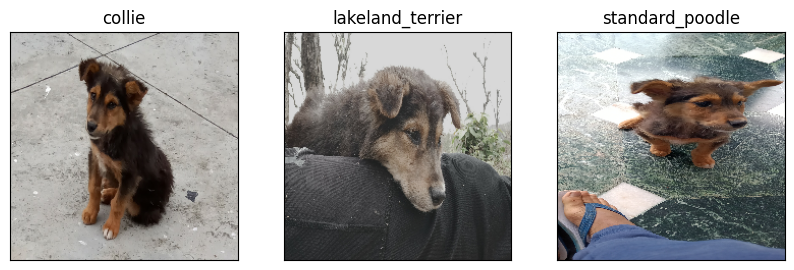

In [200]:
#Check custom image predictions
plt.figure(figsize=(10,10))
for i,image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)